# Predicting Future Stock Prices

In [13]:
!python -m pip install -U --force-reinstall yfinance 

  Using cached yfinance-0.1.72-py2.py3-none-any.whl (27 kB)
     |████████████████████████████████| 4.6 MB 867 kB/s eta 0:00:01
     |████████████████████████████████| 62 kB 1.0 MB/s eta 0:00:01
     |████████████████████████████████| 11.5 MB 1.2 MB/s eta 0:00:01    |█▉                              | 675 kB 534 kB/s eta 0:00:21
     |████████████████████████████████| 18.1 MB 444 kB/s eta 0:00:01
  Using cached multitasking-0.0.10-py3-none-any.whl
     |████████████████████████████████| 503 kB 1.5 MB/s eta 0:00:01
     |████████████████████████████████| 247 kB 1.2 MB/s eta 0:00:01
     |████████████████████████████████| 61 kB 1.2 MB/s eta 0:00:01
     |████████████████████████████████| 160 kB 1.2 MB/s eta 0:00:01
     |████████████████████████████████| 138 kB 991 kB/s eta 0:00:01
  Attempting uninstall: six
    Found existing installation: six 1.16.0
    Uninstalling six-1.16.0:
      Successfully uninstalled six-1.16.0
  Attempting uninstall: urllib3
    Found existing installation: ur

In [26]:
#import relevant libs
import pandas as pd
import numpy as np
from datetime import datetime
import yfinance as yf
import sqlalchemy
#import bamboolib as bam
#import psycopg2
import time
import plotly.express as px
import re
import logging 
from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics
from prophet.plot import plot_plotly, plot_components_plotly, add_changepoints_to_plot, plot_cross_validation_metric
logger = logging.getLogger(__name__)
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_absolute_error
from dask.distributed import Client
import itertools
#import ExploreStocks module
from StockExplore import ExploreStocks

### Instantiate Class

In [22]:
#test function
stocks = ExploreStocks(['IAG.L', '0293.HK', 'AF.PA'], '25y')

[*********************100%***********************]  3 of 3 completed
Initial Stock Information Downloaded
Currency Extracted and Merged
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Exchange Rates Obtained

% of NaN values in calculated GBP column : 0.01
Data Retrieved - access via the stock_history attribute 


/Users/JacobMennell/PycharmProjects/yahooFinanceAirlineStocks/python-class-analysis_project/StockExplore.py:123: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  currency_df['week_number_of_year'] = currency_df['Date'].dt.week


## Stock analysis

In [90]:
#lets look at df
stocks.stock_history

,Date,Ticker,Adj Close,Close,High,Low,Open,Volume,currency_code,currency_id,currency_iden,currency_close,day,GBP_calculated close
0,2000-01-03,AF.PA,21.565828,19.690001,20.290001,18.700001,19.000000,1630409.0,EUR,01032000EUR,01032000EUR,0.62540,0,12.314126
1,2000-01-04,0293.HK,8.039407,13.100000,13.600000,13.100000,13.300000,5375000.0,HKD,01042000HKD,NaN,NaN,1,NaN
2,2000-01-04,AF.PA,22.540615,20.580000,20.590000,19.209999,19.790001,1449856.0,EUR,01042000EUR,01042000EUR,0.62830,1,12.930414
3,2000-01-05,0293.HK,7.548450,12.300000,13.300000,12.000000,12.950000,8835360.0,HKD,01052000HKD,NaN,NaN,2,NaN
4,2000-01-05,AF.PA,22.452995,20.500000,20.500000,19.500000,19.600000,1054801.0,EUR,01052000EUR,01052000EUR,0.62840,2,12.882201
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16156,2022-05-26,AF.PA,1.769000,1.769000,1.784000,1.635000,1.782500,22788972.0,EUR,05262022EUR,05262022EUR,0.84903,3,1.501934
16157,2022-05-26,IAG.L,128.800003,128.800003,129.604996,125.540001,125.860001,24243388.0,GBP,05262022GBP,NaN,1.00000,3,128.800003
16158,2022-05-27,0293.HK,8.340000,8.340000,8.350000,8.010000,8.060000,15560547.0,HKD,05272022HKD,05272022HKD,0.10091,4,0.841589
16159,2022-05-27,AF.PA,1.708500,1.708500,1.786000,1.701000,1.782000,6335913.0,EUR,05272022EUR,05272022EUR,0.85050,4,1.453079


In [92]:
#plot stock price over time
stocks.plot_stock_price()

In [93]:
#plot trade volumne over time
stocks.plot_trade_volume()

In [94]:
#plot stock volatility
stocks.plot_volatility()

In [95]:
#plot rolling average
stocks.plot_rolling_average()

In [96]:
#plot cumulative return over time
stocks.plot_cumulative_returns()

## Prediction

In [97]:
#IAG.L
stocks.plot_future_trend('IAG.L', start_date = '2021-04-01', periods = 90, cap=800)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [99]:
#0293.HK
stocks.plot_future_trend('0293.HK', start_date = '2021-04-01', periods = 90, cap=30)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [100]:
#AF.PA
stocks.plot_future_trend('AF.PA', start_date = '2021-04-01', periods = 90, cap=20)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


## Investigate prediction at greater granularity - Model 1B

In [118]:
#get df from class
df=stocks.stock_history

start_date = '2021-04-01'
growth = 'logistic'
cap = 500
floor = 0
periods = 90
country_name= 'US'
changepoints = True
trend = True
stock = 'IAG.L'

post_date_df = df.loc[~(df['Date'] <= start_date)]
predict_df = post_date_df.loc[post_date_df['Ticker'].isin([stock])]
        
#rename columns to fit model
df = predict_df.rename(columns={'Date': 'ds', 'Close': 'y'})
df = df[['ds', 'y']]
df['cap'] = cap
df['floor'] = floor

#changepoint_prior_scale and seasonality_prior_scale obtained form hypertuning see below
m = Prophet(yearly_seasonality=True, 
            growth=growth,  
            interval_width=0.95, 
            changepoint_prior_scale=0.01, 
            seasonality_prior_scale=0.1)

#get currency code for stock
currency_code = predict_df['currency_code'].values[0]
        
#HOLIDAYS - default is US
if currency_code == 'GBP':
    m.add_country_holidays(country_name = "GB")
elif currency_code == 'HKD':
    m.add_country_holidays(country_name = "HK")
else: 
    m.add_country_holidays(country_name = country_name)
        
m.fit(df)

future = m.make_future_dataframe(periods)
        
# Eliminate weekend from future dataframe
future['day'] = future['ds'].dt.weekday
future = future[future['day']<=4]

future['cap'] = cap
future['floor'] = floor

forecast = m.predict(future)

#format graph
fig = plot_plotly(m, forecast, trend=trend, changepoints=changepoints)
fig.update_layout(title=f'{stock} {periods} days forecast')
output = fig.show()

#get Mean Absolute Error
df_merge = pd.merge(df, forecast[['ds','yhat_lower','yhat_upper','yhat']],on='ds')
df_merge = df_merge[['ds','yhat_lower','yhat_upper','yhat','y']]
# calculate MAE between observed and predicted values 
y_true = df_merge['y'].values
y_pred = df_merge['yhat'].values
mae = mean_absolute_error(y_true, y_pred)
mape = mean_absolute_percentage_error(y_true, y_pred)

print(f'The Mean Absolute Eror is: {"{:.2f}".format(mae)} \nThe Mean Absolute Percentage Eror is: {"{:.2f}".format(mape)} ')

output

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


The Mean Absolute Eror is: 4.92 
The Mean Absolute Percentage Eror is: 0.03 


In [119]:
#plot seasonality components
plot_components_plotly(m, forecast)

### Cross Validation to Evaluate Model

In [108]:
client = Client()  # connect to the cluster - use dash to paralleize cross-validation to speed up

df_cv = cross_validation(m, initial='200 days',
                         period='30 days', 
                         horizon='90 days',
                         parallel="dask")

df_cv.head()

INFO:prophet:Making 5 forecasts with cutoffs between 2021-10-29 00:00:00 and 2022-02-26 00:00:00
INFO:prophet:Applying in parallel with <Client: 'tcp://127.0.0.1:64490' processes=4 threads=8, memory=15.80 GiB>


,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2021-11-01,157.784417,146.839391,169.040362,166.699997,2021-10-29
1,2021-11-02,156.167930,145.663831,167.816336,163.360001,2021-10-29
2,2021-11-03,157.199558,146.791572,167.748847,167.160004,2021-10-29
3,2021-11-04,156.935195,145.350913,168.111453,169.779999,2021-10-29
4,2021-11-05,157.968806,147.222152,168.996897,180.160004,2021-10-29


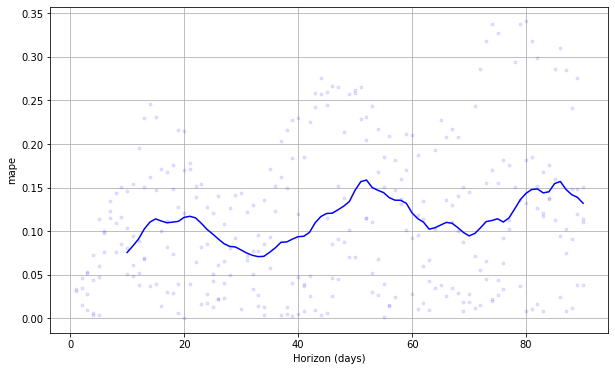

In [109]:
df_p = performance_metrics(df_cv)
fig = plot_cross_validation_metric(df_cv, metric='mape')

### Explore hypertuning of model parameters - Fed into the above model 1B

In [116]:
param_grid = {  
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
}

# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
rmses = []  # Store the RMSEs for each params here

# Use cross validation to evaluate all parameters
for params in all_params:
    m = Prophet(**params).fit(df)  # Fit model with given params
    df_cv = cross_validation(m, horizon='90 days', parallel="dask")
    df_p = performance_metrics(df_cv, rolling_window=1)
    rmses.append(df_p['rmse'].values[0])

# Find the best parameters
tuning_results = pd.DataFrame(all_params)
tuning_results['rmse'] = rmses
print(tuning_results)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Making 2 forecasts with cutoffs between 2022-01-12 00:00:00 and 2022-02-26 00:00:00
INFO:prophet:Applying in parallel with <Client: 'tcp://127.0.0.1:64490' processes=4 threads=8, memory=15.80 GiB>
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Making 2 forecasts with cutoffs between 2022-01-12 00:00:00 and 2022-02-26 00:00:00
INFO:prophet:Applying in parallel with <Client: 'tcp://127.0.0.1:64490' processes=4 threads=8, memory=15.80 GiB>
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonali

    changepoint_prior_scale  seasonality_prior_scale       rmse
0                     0.001                     0.01  17.264414
1                     0.001                     0.10  17.233588
2                     0.001                     1.00  17.226158
3                     0.001                    10.00  17.223972
4                     0.010                     0.01  16.560453
5                     0.010                     0.10  16.558657
6                     0.010                     1.00  16.725639
7                     0.010                    10.00  16.720101
8                     0.100                     0.01  39.366306
9                     0.100                     0.10  39.406398
10                    0.100                     1.00  39.881736
11                    0.100                    10.00  38.972379
12                    0.500                     0.01  39.396857
13                    0.500                     0.10  39.199940
14                    0.500             